# M7.2 earthquake offshore Shumagin

In [36]:
import gc
import h5py
import torch
import numpy as np
import torch.nn as nn

from matplotlib import pyplot as plt
from numpy.random import default_rng
from scipy.signal import filtfilt, butter
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

from das_util import try_gpu
from das_util import next_power_of_2
from das_util import fk_filter_2cones
from das_denoise_models import unet, dataflow
from das_denoise_training import train_augmentation

In [37]:
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
client = Client("IRIS")
t = UTCDateTime("2023-07-16T06:49:04")

## Read event data

In [38]:
dir_terra = '/fd1/QibinShi_data/akdas/M72Jul16/terra/'
dir_kkfls = '/fd1/QibinShi_data/akdas/M72Jul16/kkfls/'
sample_rate = 25
delta_space = 10

full_terra = []
full_kkfls = []
for i in np.arange(49, 60):
    file = 'decimator2_2023-07-16_06.' + str(i) + '.04_UTC.h5'
    with h5py.File(dir_terra + file, 'r') as f:
        quake1 = f['Acquisition']['Raw[0]']['RawData'][:1500, :7500].T
    full_terra.append(quake1)
    file = 'decimator2_2023-07-16_06.' + str(i) + '.08_UTC.h5'
    with h5py.File(dir_kkfls + file, 'r') as f:
        quake2 = f['Acquisition']['Raw[0]']['RawData'][:1500, :7500].T
    full_kkfls.append(quake2)
    
terra_data = np.concatenate(full_terra, axis=1)
kkfls_data = np.concatenate(full_kkfls, axis=1)

# %% save it to HDF5 for future use
# with h5py.File('/fd1/QibinShi_data/akdas/M72Jul16/terra-0649-0659.h5', 'w') as f:
#     f.create_dataset("data", data=terra_data)
# with h5py.File('/fd1/QibinShi_data/akdas/M72Jul16/kkfls-0649-0659.h5', 'w') as f:
#     f.create_dataset("data", data=kkfls_data)

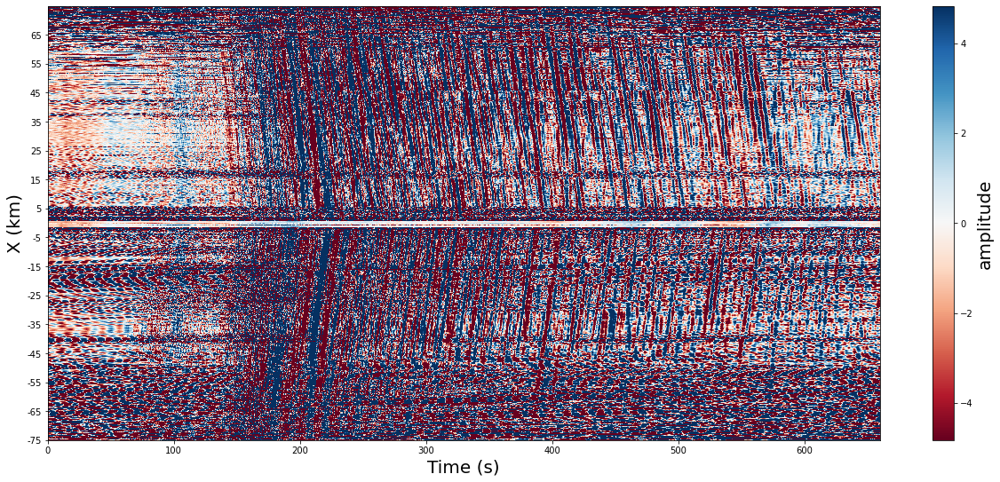

In [39]:
all_data = np.append(kkfls_data[::-1,:], terra_data, axis=0)

plt.figure(figsize=(21, 9)); cmap=plt.cm.get_cmap('RdBu'); max_amp = np.median(np.fabs(all_data))
x, y=np.arange(all_data.shape[1]), np.arange(all_data.shape[0])
plt.pcolormesh(x, y, all_data, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.xticks(np.arange(0, 16500, 2500), np.arange(0, 16500/sample_rate, 2500/sample_rate).astype(int))
plt.yticks(np.arange(0, 15000, 1000), (np.arange(-7500, 7500, 1000)/1000*delta_space).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("X (km)", fontsize=20)
cbr=plt.colorbar(); cbr.set_label('amplitude', fontsize = 20)

# FK filter

In [5]:
filt_terra, mask_fk_terra, fk_terra = fk_filter_2cones(terra_data.T, w1=0.003, w2=0.4, cone1=True, cone2=True)
filt_kkfls, mask_fk_kkfls, fk_kkfls = fk_filter_2cones(kkfls_data.T, w1=0.003, w2=0.4, cone1=True, cone2=True)
all_filt = np.append(filt_kkfls.T[::-1,:], filt_terra.T, axis=0)

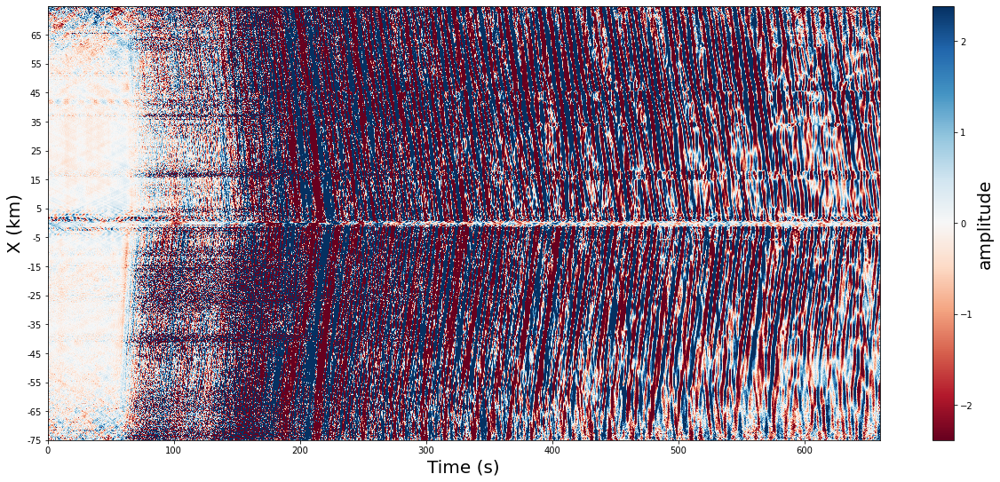

In [6]:
plt.figure(figsize=(21, 9)); max_amp = np.median(np.fabs(all_filt.real))
plt.pcolormesh(x, y, all_filt.real, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.xticks(np.arange(0, 16500, 2500), np.arange(0, 16500/sample_rate, 2500/sample_rate).astype(int))
plt.yticks(np.arange(0, 15000, 1000), (np.arange(-7500, 7500, 1000)/1000*delta_space).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("X (km)", fontsize=20)
cbr=plt.colorbar(); cbr.set_label('amplitude', fontsize = 20)

/tmp/ipykernel_2986922/3200084179.py:11: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(mask_fk_terra)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
/tmp/ipykernel_2986922/3200084179.py:22: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(mask_fk_kkfls)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)


Text(0, 0.5, 'Frequency(Hz)')

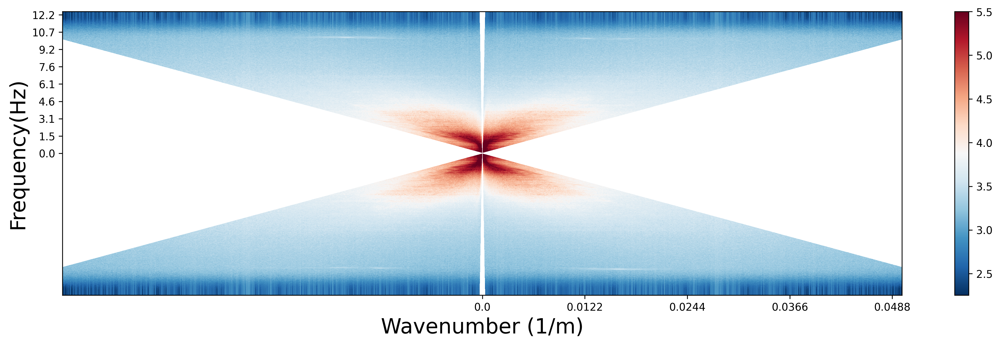

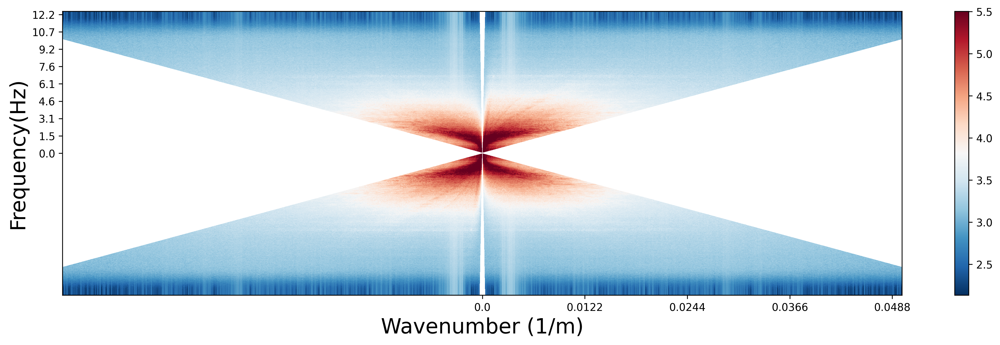

In [7]:
f0 = np.fft.fftshift(np.fft.fftfreq(next_power_of_2(16500),d=1./sample_rate))
k0 = np.fft.fftshift(np.fft.fftfreq(next_power_of_2(7500),d=delta_space))
df = f0[1]-f0[0]
dk = k0[1]-k0[0]

amps = np.log10(np.abs(fk_terra)).flatten()
q1=np.percentile(amps, q=1)
q2=np.percentile(amps, q=99)

plt.figure(figsize=(18, 5), dpi=300)
plt.imshow(np.log10(np.abs(mask_fk_terra)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
plt.colorbar()
plt.xticks(np.arange(int(len(k0)/2), len(k0), 1000), np.round(k0[np.arange(int(len(k0)/2), len(k0), 1000)], decimals=4))
plt.yticks(np.arange(int(len(f0)/2), len(f0), 2000), np.round(f0[np.arange(int(len(f0)/2), len(f0), 2000)], decimals=1))
plt.xlabel("Wavenumber (1/m)", fontsize=20)
plt.ylabel("Frequency(Hz)", fontsize=20)

amps = np.log10(np.abs(fk_kkfls)).flatten()
q1=np.percentile(amps, q=1)
q2=np.percentile(amps, q=99)
plt.figure(figsize=(18, 5), dpi=300)
plt.imshow(np.log10(np.abs(mask_fk_kkfls)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
plt.colorbar()
plt.xticks(np.arange(int(len(k0)/2), len(k0), 1000), np.round(k0[np.arange(int(len(k0)/2), len(k0), 1000)], decimals=4))
plt.yticks(np.arange(int(len(f0)/2), len(f0), 2000), np.round(f0[np.arange(int(len(f0)/2), len(f0), 2000)], decimals=1))
plt.xlabel("Wavenumber (1/m)", fontsize=20)
plt.ylabel("Frequency(Hz)", fontsize=20)

## Bandpass filter

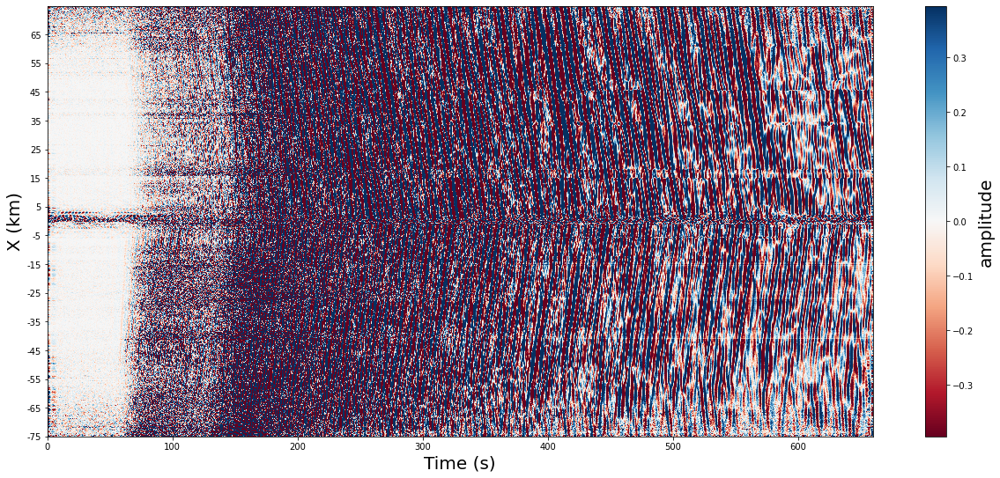

In [8]:
b, a = butter(4, (0.1, 12), fs=sample_rate, btype='bandpass')
filt = filtfilt(b, a, all_filt.real, axis=1)
all_bp_fk = filt / np.std(filt, axis=1, keepdims=True)

plt.figure(figsize=(21, 9)); max_amp = np.median(np.fabs(all_bp_fk))
plt.pcolormesh(x, y, all_bp_fk, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.xticks(np.arange(0, 16500, 2500), np.arange(0, 16500/sample_rate, 2500/sample_rate).astype(int))
plt.yticks(np.arange(0, 15000, 1000), (np.arange(-7500, 7500, 1000)/1000*delta_space).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("X (km)", fontsize=20)
cbr=plt.colorbar(); cbr.set_label('amplitude', fontsize = 20)

(0.0, 16500.0)

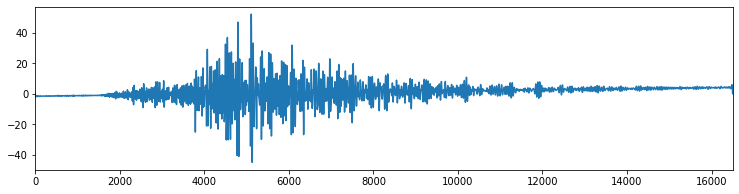

In [58]:
trace = all_filt.real[7000]
# trace = all_data[7000]
b, a = butter(4, (0.5, 10), fs=sample_rate, btype='bandpass')
filt = filtfilt(b, a, trace, axis=0)
trace = (filt-np.mean(filt)) / np.std(filt)

plt.figure(figsize=(12.5, 3))
plt.plot(np.arange(trace.shape[0]), np.cumsum(trace))
plt.xlim(0,trace.shape[0])

## Compare to broadband stations

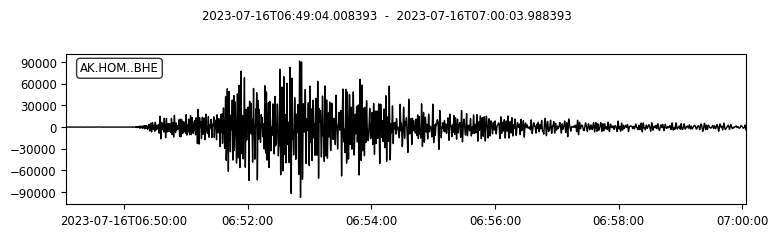

3 Trace(s) in Stream:
AK.HOM..BHE | 2023-07-16T06:49:04.008393Z - 2023-07-16T07:00:03.988393Z | 50.0 Hz, 33000 samples
AK.HOM..BHN | 2023-07-16T06:49:04.008393Z - 2023-07-16T07:00:03.988393Z | 50.0 Hz, 33000 samples
AK.HOM..BHZ | 2023-07-16T06:49:04.008393Z - 2023-07-16T07:00:03.988393Z | 50.0 Hz, 33000 samples


In [57]:
st = client.get_waveforms("AK", "HOM", "*", "BH?", t, t + 11 * 60)
st[0].filter('bandpass',freqmin=0.5, freqmax=10).integrate(method='cumtrapz').plot()
# st[0].filter('bandpass',freqmin=0.01, freqmax=10)
print(st)

(33000,)


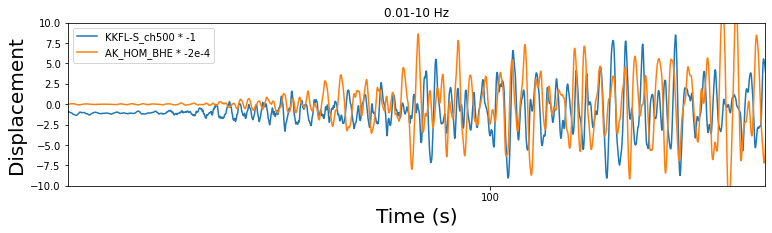

In [65]:
hom=st[0].data
hom1=st[2].data
print(hom.shape)
plt.figure(figsize=(12.5, 3))
plt.plot(np.arange(trace.shape[0]), np.cumsum(trace), label='KKFL-S_ch500 * -1')
plt.plot(np.arange(trace.shape[0]), hom[::2]*(-5.3e-4), label='AK_HOM_BHE * -2e-4')
# plt.plot(np.arange(trace.shape[0]), hom1[::2]*(-1.3e-4), label='AK_HOM_BHZ * -1e-4')
plt.xticks(np.arange(0, 16500, 2500), np.arange(0, 16500/sample_rate, 2500/sample_rate).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("Displacement", fontsize=20)
plt.xlim(trace.shape[0]/13,trace.shape[0]/5)
plt.ylim(-10,10)
plt.title('0.01-10 Hz')
plt.legend()

## MAE denoising

In [27]:
""" Initialize the U-net model """
model = unet(1, 16, 1024, factors=(5, 3, 2, 2))
devc = try_gpu(i=1)
model = nn.DataParallel(model, device_ids=[1,2,3])  # comment if gpus<4 
model.to(devc)

model.load_state_dict(torch.load('checkpoint.pt'))

<All keys matched successfully>

### Extract the 1500 channels in the middle

10


[Text(0, 0, '0'),
 Text(0, 200, '2'),
 Text(0, 400, '4'),
 Text(0, 600, '6'),
 Text(0, 800, '8'),
 Text(0, 1000, '10'),
 Text(0, 1200, '12'),
 Text(0, 1400, '14')]

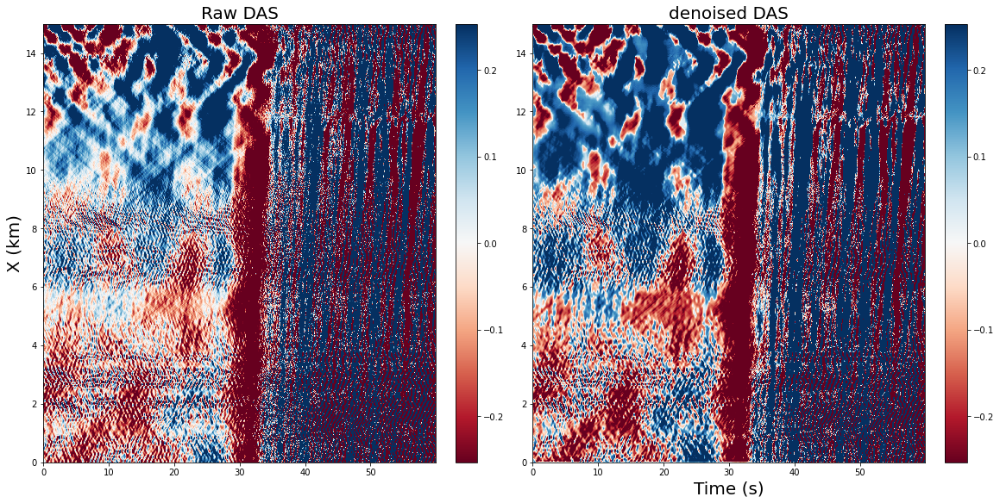

In [31]:
tmp = all_filt.real[5750:7250, 750:-750]  # use FK filtered
# tmp = all_data[5750:7250, 750:-750]  # use raw data
tmps = np.reshape(tmp, (1500,10,1500)).swapaxes(0,1)
test_data = dataflow(tmps, stride=1500, mask_ratio=0.2, n_masks=1)
print(len(test_data))
(X, mask), Y = test_data[0:1]
# %% convert to torch tensors
X = torch.from_numpy(X).to(devc)
mask = torch.from_numpy(mask).to(devc)

inputdata=X
maskdata=X*(1-mask)

# %% make a prediction use the best model
model.eval() 
with torch.no_grad():
    pred = model(inputdata)
    tmp = model(pred)
    tmp = model(tmp)
    tmp = model(tmp)



# %% convert back to numpy for plotting
denoised = tmp[0,0].to('cpu').numpy()
rawdata = X[0,0].to('cpu').numpy()

# visualize all
fig, ax = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)
cmap=plt.cm.get_cmap('RdBu')
x, y = np.arange(rawdata.shape[1]), np.arange(rawdata.shape[0])

max_amp = np.median(np.fabs(rawdata))
img=ax[0].pcolormesh(x, y, rawdata, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.colorbar(img, ax=ax[0])

ax[0].set_title("Raw DAS", fontsize=20)
ax[0].set_xticks(np.arange(0, 1500, 250)) 
ax[0].set_xticklabels(np.arange(0, 1500/sample_rate, 250/sample_rate).astype(int))
ax[0].set_ylabel("X (km)", fontsize=20)
ax[0].set_yticks(np.arange(0, 1500, 200))
ax[0].set_yticklabels((np.arange(0, delta_space*1500, 200*delta_space)/1000).astype(int))

# max_amp = np.median(np.fabs(denoised))
img=ax[1].pcolormesh(x, y, denoised, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.colorbar(img, ax=ax[1])

ax[1].set_xlabel("Time (s)", fontsize=20)
ax[1].set_xticks(np.arange(0, 1500, 250)) 
ax[1].set_xticklabels(np.arange(0, 1500/sample_rate, 250/sample_rate).astype(int))
ax[1].set_title("denoised DAS", fontsize=20)
ax[1].set_yticks(np.arange(0, 1500, 200))
ax[1].set_yticklabels((np.arange(0, delta_space*1500, 200*delta_space)/1000).astype(int))

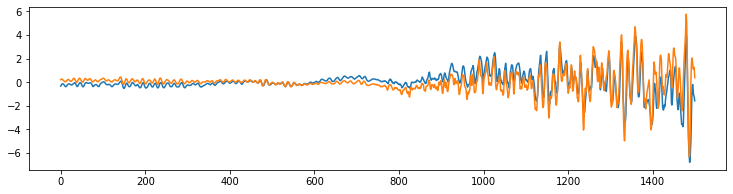

In [35]:
trace1 = denoised[650]
trace2 = rawdata[650]
b, a = butter(4, (0.01, 10), fs=sample_rate, btype='bandpass')
filt1 = filtfilt(b, a, trace1, axis=0)
trace1 = (filt1-np.mean(filt1)) / np.std(filt1)

filt2 = filtfilt(b, a, trace2, axis=0)
trace2 = (filt2-np.mean(filt2)) / np.std(filt2)

plt.figure(figsize=(12.5, 3))
plt.plot(np.arange(trace1.shape[0]), (trace1))
plt.plot(np.arange(trace2.shape[0]), (trace2))
